In [1]:
import json

import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline

In [2]:
def read_json(filename):
    json_path = r"data/" + filename
    with open(json_path, "r") as infile:
        data = json.load(infile)

        return data

Generate materials for training and testing.

In [3]:
train_data_articles: list = [ _['content'] for _ in read_json('train_data.json')]

In [4]:
train_data_articles

['Throughout our history we’ve learned this lesson – when dictators do not pay a price for their aggression, they cause more chaos.\nThey keep moving. And, the costs and threats to America and the world keep rising.That’s why the NATO Alliance was created to secure peace and stability in Europe after World War 2. The United States is a member along with 29 other nations.It matters. American diplomacy matters.Putin’s war was premeditated and unprovoked. He rejected efforts at diplomacy. He thought the West and NATO wouldn’t respond. And, he thought he could divide us here at home.Putin was wrong. We were ready.\n—\nWe have a choice. One way to fight inflation is to drive down wages and make Americans poorer. I have a better plan to fight inflation.Lower your costs, not your wages. Make more cars and semiconductors in America. More infrastructure and innovation in America. More goods moving faster and cheaper in America. More jobs where you can earn a good living in America. And, instead

In [5]:
train_data_categories: list = [ _['category'] for _ in read_json('train_data.json')]

In [6]:
test_data_articles = [ _['content'] for _ in read_json('test_data.json')]

In [7]:
test_data_categories: list = [ _['category'] for _ in read_json('test_data.json')]

Find the best accuracy from k value 1 to 100.

In [8]:
accuracies = []
for i in range(1, 100):
    # mutable k value
    knn = KNeighborsClassifier(n_neighbors=i)

    # We can use Pipeline to add vectorizer -> classifier all in a one compound classifier
    text_clf = Pipeline([
        ('vect', CountVectorizer(stop_words={'english'})),
        ('clf', knn),
    ])

    # Fitting our train data to the pipeline
    text_clf.fit(train_data_articles, train_data_categories)

    # Test data 
    docs_test = test_data_articles

    # Predicting our test data
    predicted = text_clf.predict(docs_test)
    accuracy = np.mean(predicted == test_data_categories) * 100
    accuracies.append(accuracy)

Find the optimal K and plot the result of the accuracies.

In [9]:
import pandas as pd
from matplotlib import pyplot as plt

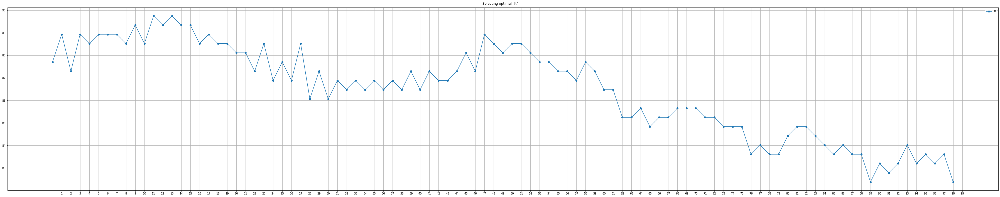

In [10]:
report_df = pd.DataFrame(accuracies)
report_df.plot(figsize=(50, 10),
               xticks=range(1, 100),
               grid=True,
               title=f'Selecting optimal "K"',
               subplots=True,
               marker='o',
               sharex=True)
plt.tight_layout()

In [31]:
max_value = max(accuracies)
max_value_index = accuracies.index(max_value)
print('The best accuracy is %.4f%%' %max_value, 'when k = %d.' %max_value_index)

The best accuracy is 89.7541% when k = 11.
